# EDA-King County House Prices

Author: Gregor Habeck

In [212]:
# import modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

%matplotlib inline
plt.style.use('seaborn')
pd.set_option("display.max_columns", None)
#np.random.seed(42)

The dataset consisted of historic data of houses sold between May 2014 to May 2015. Can it be used to predict housing prices using multiple linear regression.

In [242]:
# import data
hp = pd.read_csv('~/nf-sep-20/cgn-2020-ds-Project-EDA/King_County_House_prices_dataset.csv', delimiter = ',',
                 skipinitialspace=True, na_values= ['?'])

While looking at the CSV file I noticed that some values are missing. Moreover, some missing values are indicated by a '?'. These question marks will be replaced by NaN.

In [510]:
#get a quick look at the data
hp.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
5,7237550310,5/12/2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930
8,2414600126,4/15/2015,229500.0,3,1.00,1780,7470,1.0,0.0,0.0,3,7,1050,730.0,1960,0.0,98146,47.5123,-122.337,1780,8113
9,3793500160,3/12/2015,323000.0,3,2.50,1890,6560,2.0,0.0,0.0,3,7,1890,0.0,2003,0.0,98038,47.3684,-122.031,2390,7570
10,1736800520,4/3/2015,662500.0,3,2.50,3560,9796,1.0,NaN,0.0,3,8,1860,1700.0,1965,0.0,98007,47.6007,-122.145,2210,8925
11,9212900260,5/27/2014,468000.0,2,1.00,1160,6000,1.0,0.0,0.0,4,7,860,300.0,1942,0.0,98115,47.6900,-122.292,1330,6000


# Type of data and missing values

In [244]:
print(f'the dataset has {hp.shape[1]} variables and {hp.shape[0]} entries.')

the dataset has 21 variables and 21597 entries.


In [245]:
hp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21143 non-null float64
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(9), int64(11), object(1)
memory usage: 3.5+ MB


All variables, but '_date_', are integers or floats.

In [246]:
# identify missing values
missing=pd.DataFrame(hp.isna().sum(), columns = ['numbers'])
missing['percentage']= round(100*missing.numbers/hp.shape[0], 2)
missing[missing.numbers != 0]

,numbers,percentage
waterfront,2376,11.00
view,63,0.29
sqft_basement,454,2.10
yr_renovated,3842,17.79


Of the 21 variable only 4 have missing values:
* __view__ has only 0.29 % of all instances missing
* __sqft_basement__ has only 2.1% of all instances missing


As thes percentages are so low, rows containing these instances will be dropped.


* __yr_renovated__ has 17.79% of all instances missing
* __waterfront__ has 11% of all instances missing 

As to the question whether these row can be dropped, more research and data analysis is needed (see below).

In [247]:
hp = hp.dropna(subset = ['view', 'sqft_basement'], axis = 0)
hp.shape

(21082, 21)

## Variable discription from [kaggle](https://www.kaggle.com/swathiachath/kc-housesales-data)
|Variable| Definition                | Type         |
|:--------|:---------------------------|:--------------|
|id | a notation for a house | Numeric|
|date | Date house was sold | String |
|price | Price is prediction target | Numeric ratio |
|bedrooms | Number of Bedrooms/House | Numeric  |
|bathrooms | Number of bathrooms/bedrooms | Numeric  |
|sqftliving | square footage of the home | Numeric  | 
|sqftlot | square footage of the lot | Numeric  |
|floors | Total floors (levels) in house | Numeric |
|waterfront | House which has a view to a waterfront | dichotomous |
|view | Has been viewed ?? or View score | Numeric nominal|
|condition | How good the condition is (Overall, see below) | Numeric |
|grade overall | grade given to the housing unit (see below) | Numeric |
|sqftabove | square footage of house apart from basement | Numeric | 
|sqftbasement | square footage of the basement | Numeric |
|yrbuilt | Built Year|| Numeric | 
|yrrenovated | Year when house was renovated | Numeric |
|zipcode | zip | Numeric |
|lat | Latitude coordinate | Numeric |
|long | Longitude coordinate | Numeric |
|sqftliving15 | Living room area in 2015(implies-- some renovations) This might or might not have affected the lotsize area or living room square footage of the 15 nearest neighbous | Numeric | 
|sqftlot15 | lot Size area in 2015(implies-- some renovations)  or lot square footage of the 15 nearest neighbous| Numeric |

Note that the kaggle description for "sqftliving15" and  "sqftlot15" differs from the description provided with the dataset. This issue will be addressed later.

### Information from [kingcounty.gov](https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r) regarding condition and grade

#### Condition:
1 = Poor- Worn out. Repair and overhaul needed on painted surfaces, roofing, plumbing, heating and numerous functional inadequacies. Excessive deferred maintenance and abuse, limited value-in-use, approaching abandonment or major reconstruction; reuse or change in occupancy is imminent. Effective age is near the end of the scale regardless of the actual chronological age.

2 = Fair- Badly worn. Much repair needed. Many items need refinishing or overhauling, deferred maintenance obvious, inadequate building utility and systems all shortening the life expectancy and increasing the effective age.

3 = Average- Some evidence of deferred maintenance and normal obsolescence with age in that a few minor repairs are needed, along with some refinishing. All major components still functional and contributing toward an extended life expectancy. Effective age and utility is standard for like properties of its class and usage.

4 = Good- No obvious maintenance required but neither is everything new. Appearance and utility are above the standard and the overall effective age will be lower than the typical property.

5= Very Good- All items well maintained, many having been overhauled and repaired as they have shown signs of wear, increasing the life expectancy and lowering the effective age with little deterioration or obsolescence evident with a high degree of utility.

#### Grade
Represents the construction quality of improvements. Grades run from grade 1 to 13. Generally defined as:

1-3 Falls short of minimum building standards. Normally cabin or inferior structure.

4 Generally older, low quality construction. Does not meet code.

5 Low construction costs and workmanship. Small, simple design.

6 Lowest grade currently meeting building code. Low quality materials and simple designs.

7 Average grade of construction and design. Commonly seen in plats and older sub-divisions.

8 Just above average in construction and design. Usually better materials in both the exterior and interior finish work.

9 Better architectural design with extra interior and exterior design and quality.

10 Homes of this quality generally have high quality features. Finish work is better and more design quality is seen in the floor plans. Generally have a larger square footage.

11 Custom design and higher quality finish work with added amenities of solid woods, bathroom fixtures and more luxurious options.

12 Custom design and excellent builders. All materials are of the highest quality and all conveniences are present.

13 Generally custom designed and built. Mansion level. Large amount of highest quality cabinet work, wood trim, marble, entry ways etc.


## Are there duplicates in the dataset?

In [248]:
duplicates = hp[hp.duplicated(subset = 'id', keep = False)]
print(duplicates.shape)
print(duplicates.id.nunique())

(345, 21)
172


In [249]:
duplicates.head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
93,6021501535,7/25/2014,430000.0,3,1.50,1580,5000,1.0,0.0,0.0,3,8,1290,290.0,1939,0.0,98117,47.6870,-122.386,1570,4500
94,6021501535,12/23/2014,700000.0,3,1.50,1580,5000,1.0,0.0,0.0,3,8,1290,290.0,1939,0.0,98117,47.6870,-122.386,1570,4500
313,4139480200,6/18/2014,1380000.0,4,3.25,4290,12103,1.0,0.0,3.0,3,11,2690,1600.0,1997,0.0,98006,47.5503,-122.102,3860,11244
314,4139480200,12/9/2014,1400000.0,4,3.25,4290,12103,1.0,0.0,3.0,3,11,2690,1600.0,1997,0.0,98006,47.5503,-122.102,3860,11244
324,7520000520,9/5/2014,232000.0,2,1.00,1240,12092,1.0,NaN,0.0,3,6,960,280.0,1922,1984.0,98146,47.4957,-122.352,1820,7460
325,7520000520,3/11/2015,240500.0,2,1.00,1240,12092,1.0,0.0,0.0,3,6,960,280.0,1922,1984.0,98146,47.4957,-122.352,1820,7460
345,3969300030,7/23/2014,165000.0,4,1.00,1000,7134,1.0,0.0,0.0,3,6,1000,0.0,1943,0.0,98178,47.4897,-122.240,1020,7138
346,3969300030,12/29/2014,239900.0,4,1.00,1000,7134,1.0,0.0,0.0,3,6,1000,0.0,1943,NaN,98178,47.4897,-122.240,1020,7138
371,2231500030,10/1/2014,315000.0,4,2.25,2180,10754,1.0,NaN,0.0,5,7,1100,1080.0,1954,0.0,98133,47.7711,-122.341,1810,6929
372,2231500030,3/24/2015,530000.0,4,2.25,2180,10754,1.0,0.0,0.0,5,7,1100,1080.0,1954,0.0,98133,47.7711,-122.341,1810,6929


In [250]:
# What is the highest count of duplicates in the dataset?
max(duplicates.id.value_counts())

3

In [251]:
duplicates.id.value_counts().head(5)

795000620     3
8651402750    2
2206700215    2
7387500235    2
9238500040    2
Name: id, dtype: int64

In [252]:
# get the objects that are present three times in the dataset
duplicates.loc[duplicates['id'] == 795000620]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
17588,795000620,9/24/2014,115000.0,3,1.0,1080,6250,1.0,0.0,0.0,2,5,1080,0.0,1950,0.0,98168,47.5045,-122.33,1070,6250
17589,795000620,12/15/2014,124000.0,3,1.0,1080,6250,1.0,0.0,0.0,2,5,1080,0.0,1950,0.0,98168,47.5045,-122.33,1070,6250
17590,795000620,3/11/2015,157000.0,3,1.0,1080,6250,1.0,NaN,0.0,2,5,1080,0.0,1950,NaN,98168,47.5045,-122.33,1070,6250


172 houses appear in the dataset more than once based on the id. While one object is listed three times, the other houses are present twice. Since there is no obvious reason as to why duplicates should infer with downstream analysis and modeling, duplicates will be kept in the data set.

## Identify categorical/numeric nominal values and outliers

In [253]:
hp.describe().round(2)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.108200e+04,21082.00,21082.00,21082.00,21082.00,21082.00,21082.00,18749.00,21082.00,21082.00,21082.00,21082.00,21082.00,21082.00,17340.00,21082.00,21082.00,21082.00,21082.00,21082.00
mean,4.582793e+09,540246.89,3.37,2.12,2080.36,15077.59,1.49,0.01,0.23,3.41,7.66,1789.00,291.36,1971.02,83.11,98077.86,47.56,-122.21,1986.92,12732.51
std,2.876423e+09,366732.34,0.92,0.77,917.86,41173.38,0.54,0.09,0.77,0.65,1.17,828.37,442.01,29.32,398.76,53.53,0.14,0.14,685.54,27148.78
min,1.000102e+06,78000.00,1.00,0.50,370.00,520.00,1.00,0.00,0.00,1.00,3.00,370.00,0.00,1900.00,0.00,98001.00,47.16,-122.52,399.00,651.00
25%,2.123700e+09,322000.00,3.00,1.75,1430.00,5040.00,1.00,0.00,0.00,3.00,7.00,1200.00,0.00,1952.00,0.00,98033.00,47.47,-122.33,1490.00,5100.00
50%,3.904970e+09,450000.00,3.00,2.25,1910.00,7620.00,1.50,0.00,0.00,3.00,7.00,1560.00,0.00,1975.00,0.00,98065.00,47.57,-122.23,1840.00,7626.00
75%,7.312200e+09,645000.00,4.00,2.50,2550.00,10697.75,2.00,0.00,0.00,4.00,8.00,2210.00,560.00,1997.00,0.00,98117.00,47.68,-122.12,2360.00,10088.75
max,9.900000e+09,7700000.00,33.00,8.00,13540.00,1651359.00,3.50,1.00,4.00,5.00,13.00,9410.00,4820.00,2015.00,2015.00,98199.00,47.78,-121.32,6210.00,871200.00


#### Remove price outliers

In [254]:
# remove 'price' outliers that fall outside +/- 3  standard deviations around the mean
import scipy
z_score = scipy.stats.zscore(hp.price)
abs_z_score =np.abs(z_score)
filtered_entries = z_score < 3
filtered_hp = hp[filtered_entries]
filtered_hp.shape

(20683, 21)

In [255]:
#Are there variables with few distint observations 
filtered_hp.nunique()

id               20513
date               371
price             3444
bedrooms            12
bathrooms           26
sqft_living        945
sqft_lot          9416
floors               6
waterfront           2
view                 5
condition            5
grade               10
sqft_above         879
sqft_basement      284
yr_built           116
yr_renovated        69
zipcode             70
lat               5010
long               749
sqft_living15      754
sqft_lot15        8353
dtype: int64

'grade', 'bedrooms', 'waterfront', 'view', 'floors' and possibly 'bathromms' seem to be numeric ordinal.

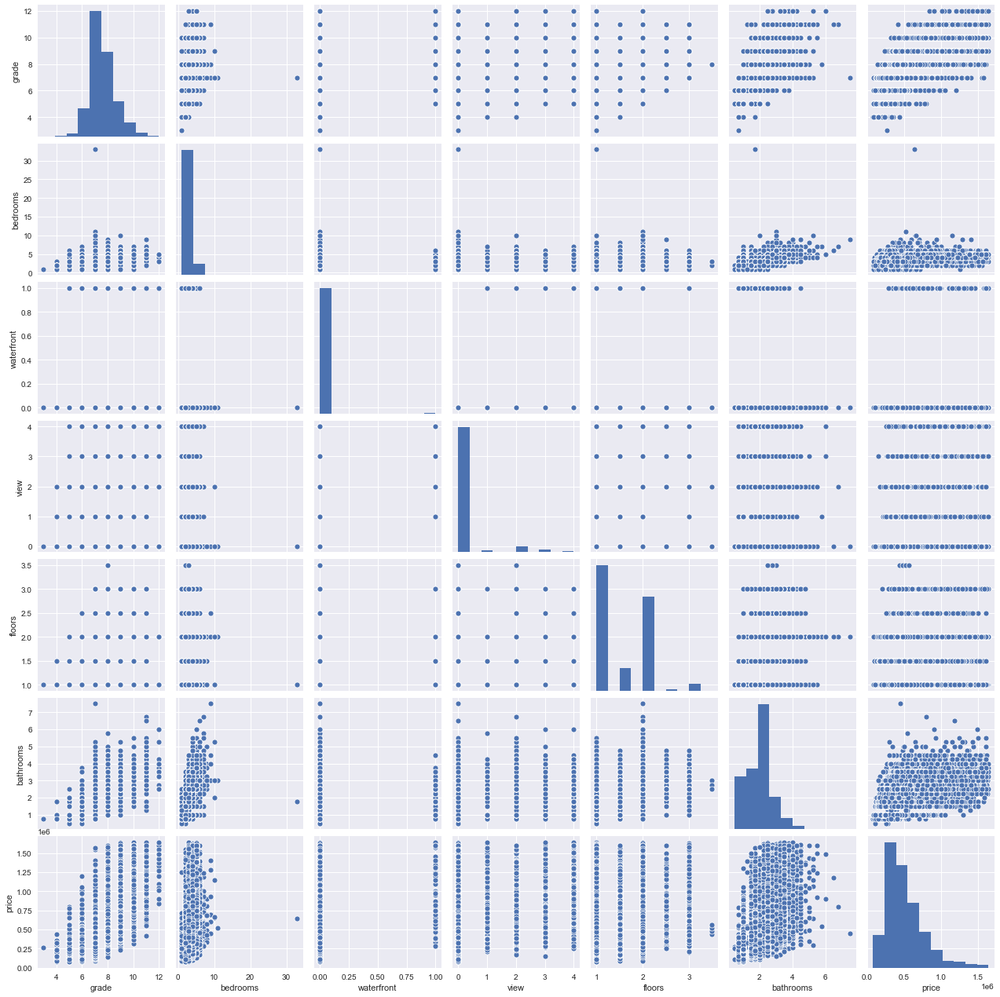

In [256]:
# plot pairwise relationship of selected variables using Seaborn's pairplot
cols_test = ['grade', 'bedrooms', 'waterfront', 'view', 'floors', 'bathrooms', 'price']
sns.pairplot(filtered_hp[cols_test]);

'bedrooms' seems to have one extrem outlier (>30 bedrooms).

In [257]:
filtered_hp.sort_values('bedrooms').tail(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
13301,627300145,8/14/2014,1150000.0,10,5.25,4590,10920,1.0,0.0,2.0,3,9,2500,2090.0,2008,0.0,98004,47.5861,-122.113,2730,10400
15147,5566100170,10/29/2014,650000.0,10,2.00,3610,11914,2.0,0.0,0.0,4,7,3010,600.0,1958,0.0,98006,47.5705,-122.175,2040,11914
19239,8812401450,12/29/2014,660000.0,10,3.00,2920,3745,2.0,0.0,0.0,4,7,1860,1060.0,1913,0.0,98105,47.6635,-122.320,1810,3745
8748,1773100755,8/21/2014,520000.0,11,3.00,3000,4960,2.0,0.0,0.0,3,7,2400,600.0,1918,1999.0,98106,47.5560,-122.363,1420,4960
15856,2402100895,6/25/2014,640000.0,33,1.75,1620,6000,1.0,0.0,0.0,5,7,1040,580.0,1947,0.0,98103,47.6878,-122.331,1330,4700


As the house with 33 bedrooms has only 1620 sqft it is reasnoable to assume a false entry. This row will be deleted.

In [258]:
filtered_hp=filtered_hp.drop(15856, axis = 0)

The min value for bathrooms is 0.5. 0.5 bathrooms usually meens no tub or shower.

In [259]:
few_bathroom = filtered_hp.query('bathrooms<0.75')
print(few_bathroom.shape)
few_bathroom

(3, 21)


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
2259,3971701455,10/3/2014,273000.0,2,0.5,1180,7750,1.0,0.0,0.0,4,6,590,590.0,1945,0.0,98155,47.7690,-122.316,1380,8976
10413,7129800036,1/14/2015,109000.0,2,0.5,580,6900,1.0,0.0,0.0,3,5,580,0.0,1941,0.0,98118,47.5135,-122.262,1570,5040
11662,7987400316,8/14/2014,255000.0,1,0.5,880,1642,1.0,0.0,0.0,3,6,500,380.0,1910,0.0,98126,47.5732,-122.372,1410,2992


4 houses have less than 0.75 bathrooms, i.e. they neither have a shower nor a tub. We will exclude these as not having either of the two is unconventional, especially when a house has 4 bedrooms.

In [260]:
# Remove all properties which obviously neither have a tub or a shower. 
filtered_hp=filtered_hp.drop(few_bathroom.index, axis = 0)

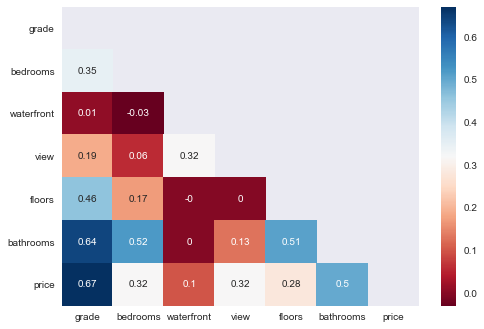

In [261]:
#make heatmap with correlation coefficients
mask = np.triu(filtered_hp[num_nom_cols].corr())
ax = sns.heatmap(filtered_hp[num_nom_cols].corr().round(2),mask = mask, annot = True, cmap = 'RdBu')

Price seems to correlate well with grade and number of bathrooms, the latter yet to a lesser extent. As number of bathromms and grade also correlate, bathrooms may be dropped for the model.

## Does the size of the apartment affect the price?

In [532]:
# How does the living area effect the price
fig = px.scatter(filtered_hp, x = 'sqft_living', y = 'price', trendline = 'ols', 
                 labels = {'price': 'Price in USD', 'sqft_living':'Living area in sqft'})
fig.update_traces(marker=dict(color = 'lightblue', size=5), line = dict(color = 'red'))
fig.update_xaxes(showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showline=True, linewidth=1, linecolor='black')
fig.update_layout(width = 900, height = 600,
                      title_text = 'House price depending on the living area', 
                      plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.show()
fig.write_image('property_price_living_area_regline.png')

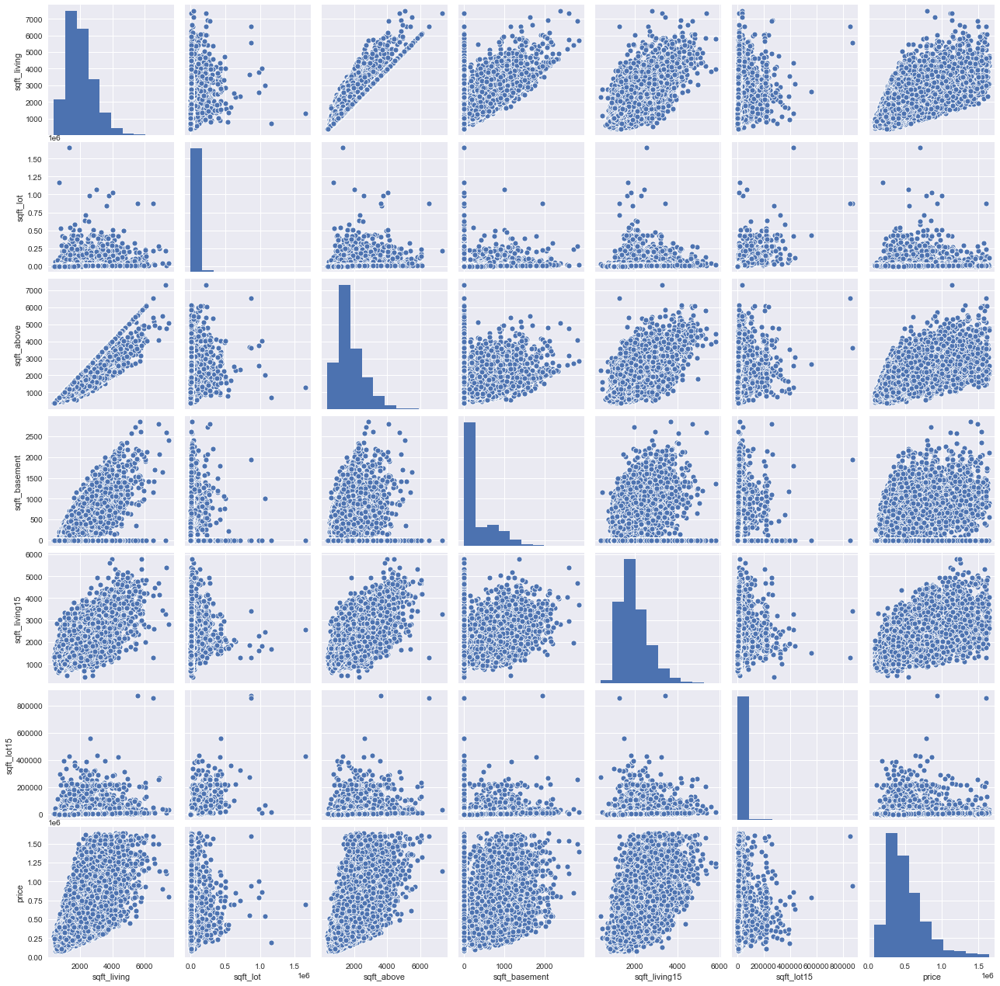

In [262]:
# make a pairplot to look at correlation of differnt 'sqft'-variables and the price
sqft_cols = [col for col in filtered_hp.columns if 'sqft' in col ] + ['price']
sns.pairplot(filtered_hp[sqft_cols]);

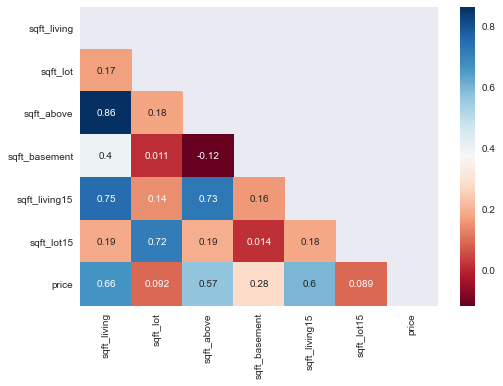

In [263]:
#make heatmap with correlation coefficients
mask = np.triu(filtered_hp[sqft_cols].corr())
corr_map = sns.heatmap(filtered_hp[sqft_cols].corr(), mask = mask, annot= True, cmap = 'RdBu')

Price coorelates with:
* sqft_living
* sqft_above
* sqft_living15

However, sft_above and sft_living 15 also co-correlate with sqft_living.

Text(0.5, 0, 'sqft_lot')

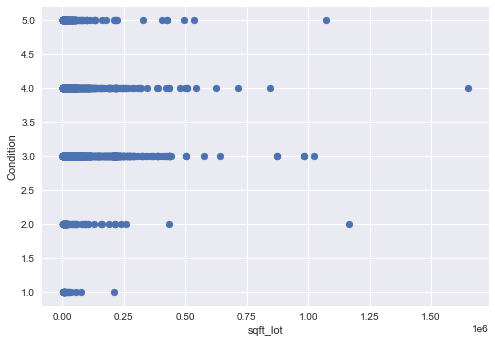

In [542]:
# are bigger properties in a good condition
plt.scatter(filtered_hp.sqft_lot, filtered_hp.condition);
plt.ylabel('Condition')
plt.xlabel('sqft_lot')

Bigger properties are still in a good condition.

## Does renovation matter?

In [264]:
filtered_hp['renovated'] = (filtered_hp.yr_renovated > 0)*1

In [265]:
#median price of all buildings
filtered_hp['price'].median()

446250.0

In [266]:
# get the median price for renovated and unrenovated houses
a=filtered_hp.groupby('renovated')['price'].median()
a

renovated
0    442500.0
1    580000.0
Name: price, dtype: float64

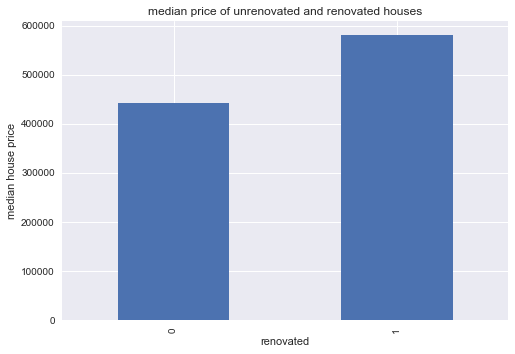

In [33]:
a.plot(kind = 'bar', title = 'median price of unrenovated and renovated houses')
plt.ylabel('median house price')
plt.xlabel('renovated')
plt.show()

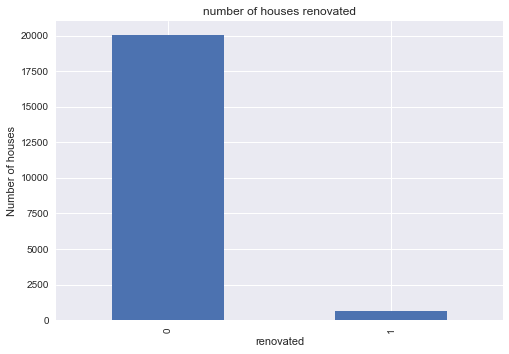

In [269]:
pd.value_counts(filtered_hp.renovated).sort_index().plot.bar(title = 'number of houses renovated')
plt.ylabel('Number of houses')
plt.xlabel('renovated')
plt.show()

In [278]:
# what is the percentage of renovated houses in the dataset
a = pd.value_counts(filtered_hp.renovated)
a[1]/sum(a.values)

0.03254509405677257

The median price for renovated buildings is 1.31x higher than buildings that have not been reported to be renovated. However, only 3.3 % of the instances in the dataset are reported to have undergone some renovations in the past. The median values of price for all instances in the dataset and for buildings that have not been reported to be renovated or have no information regarding renovation are really close.

## Does the location matter

In [512]:
# plot the different properties according to ther location (long vs lat) and color by price
loc_fig = px.scatter(filtered_hp, y = 'lat', x = 'long',color = 'price',
                     color_continuous_scale=px.colors.sequential.Inferno,
                    labels = {'lat' : 'latitude', 'long' : 'longitude'})
loc_fig.update_traces(marker=dict(size=5))
loc_fig.update_xaxes(showline=True, linewidth=1, linecolor='black', range = [-122.55, -121.25])
loc_fig.update_yaxes(showline=True, linewidth=1, linecolor='black', range = [47.1, 47.8])
loc_fig.update_layout(width = 900, height = 600,
                      title_text = 'House price depending on the geographic location', 
                      plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
loc_fig.show()
loc_fig.write_image("property_price_location.png")

In [40]:
# make correlation matrix
filtered_hp[['price', 'long', 'lat']].corr()

,price,long,lat
price,1.000000,0.047886,0.385000
long,0.047886,1.000000,-0.133788
lat,0.385000,-0.133788,1.000000


Moderate correlation between price and latitude. This is backed-up by the plot where high priced objects are found in the north but there is no obvious difference between east and west.

In [41]:
# Can we identify zip code areas with expensive or cheap properties?
# group data by zip code and calculate the median price of houses
zip_code = filtered_hp.groupby('zipcode')['price'].median()

In [289]:
# make a bar bar plot to get a quick look at the data and check whether there are expensiv zip code regions
fig = px.bar(zip_code, x = zip_code.index, y = zip_code)
fig.update_traces(marker=dict(color = 'gray'))
fig.update_xaxes(showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showline=True, linewidth=1, linecolor='black')
fig.update_layout(width = 700, height = 600, plot_bgcolor='rgba(0,0,0,0)')
fig.show()
fig.write_image("property_price_zipcode_line.png")

Looks like there are some zi pcode regions with higher or lower value properties.  
Strategy: sort zip codes into bins according to the median price of the houses in thes areas.

In [290]:
# make bins to group different zip code regions according to the median of the properties
# sort by price so that bins are made according to median price in the different zip code arreas
zip_code = zip_code.sort_values()
a = pd.Series(zip_code.index, name = 'zipcode')
b = pd.Series(zip_code, name = 'price')

When binning over the median of prices grouped by zipcode, the bins can be used to group the zip codes 
according to median house prices in the zip code areas.
If Zip codes are 'cut' based on the numerical order of the zip codes no correlation with price was evident 
(data not shown).

In [44]:
# make bins
bins = 6
x = pd.cut(b, bins = bins, labels = [i for i in range(0,bins)])
y = pd.DataFrame(data = {'zipcode':zip_code.index, 'bins':x})
y = y.reset_index(drop = True)

In [45]:
#safety copy of dataframe
test_df = filtered_hp.copy()

In [46]:
# merge dataframe to get bins into the data table
test_df = test_df.merge(y, on='zipcode', how = 'left')

In [47]:
test_df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,renovated,bins
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,60,0,0
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,64,1,1
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,82,0,1
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,50,0,1
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,28,0,2


In [48]:
#convert categorial bin values to numeric
test_df.bins = pd.to_numeric(test_df.bins);
test_df.bins.dtypes

dtype('int64')

In [49]:
# make correlation matrix
test_df[['price', 'zipcode', 'bins', 'grade', 'lat']].corr()

,price,zipcode,bins,grade,lat
price,1.000000,-0.033058,0.643187,0.671833,0.385000
zipcode,-0.033058,1.000000,-0.162485,-0.182895,0.271380
bins,0.643187,-0.162485,1.000000,0.365177,0.459218
grade,0.671833,-0.182895,0.365177,1.000000,0.102545
lat,0.385000,0.271380,0.459218,0.102545,1.000000


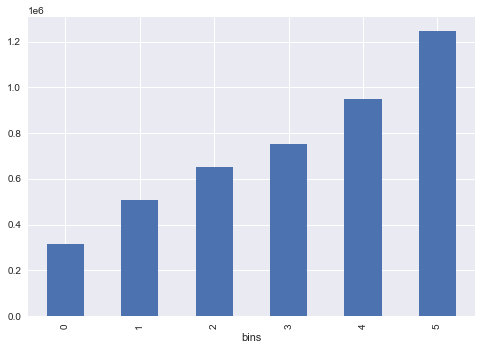

In [50]:
a = test_df.groupby('bins')['price'].median()
a.plot(kind = 'bar');

For the linear regression model we can either use these bins or we use the zip codes as categorials and greate dummy variables for all of them. Taking all the location data into consideration, the location of a property has a strong influence on the selling price of the property.

In [291]:
#Where are the expensive Zipcodes (bigger bin number means more expensiv)
fig = px.scatter(test_df, y = 'lat', x = 'long', color = 'bins', color_continuous_scale=px.colors.sequential.Inferno)
fig.update_xaxes(showline=True, linewidth=1, linecolor='black', range = [-122.55, -121.25])
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', range = [47.1, 47.8])
fig.update_layout(width = 900, height = 600,
                  title_text = 'Expensive Zip code areas', plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.update_traces(marker=dict(size=3))
fig.show()
fig.write_image("property_price_zipbins.png")

In [292]:
# as the binning and merging seems to work well, we can go back to the old filtered_hp df.
filtered_hp = test_df.copy()

## Where are the bigger properties?

In [72]:
# plot properties according to there geographic loaction, color = price, size = sqft_lot
fig = px.scatter(filtered_hp, y = 'lat', x = 'long',size = 'sqft_lot', color = 'price',
                     color_continuous_scale=px.colors.sequential.Inferno,
                    labels = {'lat' : 'latitude', 'long' : 'longitude'})
fig.update_xaxes(showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showline=True, linewidth=1, linecolor='black')
fig.update_layout(width = 900, height = 600,
                  title_text = 'Property price and size depending on the geographic location', 
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.show()
fig.write_image("property_size_price_location.png")

If you are looking for a bigger property you have to move out of the city and away from the coast. These properties are often more affordable then houses in urban areas.

# Where are the old buildings?

In [549]:
# plot properties according to there geographic loaction, color = price, size = sqft_lot
fig = px.scatter(filtered_hp, y = 'lat', x = 'long', color = 'yr_built',
                     color_continuous_scale=px.colors.sequential.Inferno,
                    labels = {'lat' : 'latitude', 'long' : 'longitude'})
fig.update_traces(marker = dict(size =3))
fig.update_xaxes(showline=True, linewidth=1, linecolor='black', range = [-122.55, -121.25])
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', range = [47.1, 47.8])
fig.update_layout(width = 900, height = 600,
                  title_text = 'Age of the building depending on the geographic loaction',
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.show()
fig.write_image("property_yr_built.png")

New buildings are spread all over King County. Older buildings are located in central Seatle.

## Does the construction year affect the price,  grade or condition

In [299]:
#check data type of yr_built variable
filtered_hp.yr_built.dtype

dtype('int64')

In [300]:
#use pd.cut() to create bins for the differnet decades houses were built in
filtered_hp['yr_built_bins'] = pd.cut(filtered_hp['yr_built'], 
                                       bins = [1899,1910,1920,1930,1940,1950,1960,1970,1980,1990,2000,2010,2015],
                                     labels = [i for i in range(1910, 2030, 10)])

In [301]:
filtered_hp['yr_built_bins'].dtype

CategoricalDtype(categories=[1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990, 2000,
                  2010, 2020],
                 ordered=True)

In [302]:
# calculate the median house price of houses built in different decades
filtered_hp.groupby('yr_built_bins')['price'].median()

yr_built_bins
1910    543500.0
1920    492500.0
1930    535000.0
1940    450000.0
1950    380000.0
1960    396240.0
1970    375000.0
1980    435000.0
1990    450000.0
2000    487550.0
2010    479950.0
2020    540000.0
Name: price, dtype: float64

In [552]:
# graphical depiction of change of median house price depending on the construction year
c = filtered_hp.groupby('yr_built')['price'].median()
fig = px.line(c, x = c.index, y = 'price', title = 'Median price depending on the construction year', 
        labels = { 'price':'price in USD'})
fig.update_traces(line=dict(color = 'black', width = 2))
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig.update_layout(width = 700, height = 600, plot_bgcolor='rgba(0,0,0,0)')
fig.show()
fig.write_image('median_price_yr_built.png')

## Are older buildings in a worse condition or have worse 'grade' scores?

In [568]:
# bar plot for mean grade of buildings built in different decades +/- stdev
grade = filtered_hp.groupby('yr_built_bins')['grade'].mean()
condition = filtered_hp.groupby('yr_built_bins')['condition'].mean()
# calculate standard dev for error bars
grade_std = filtered_hp.groupby('yr_built_bins')['grade'].std()
condition_std = filtered_hp.groupby('yr_built_bins')['condition'].std()

#create bar plot for grade scores
fig_g = px.bar(grade,x = grade.index, y = grade.values, error_y = grade_std.values , 
               labels = {'y': 'grade', 'yr_built_bins':'decade house was built in'})
fig_g.update_traces(marker_color = 'white', marker_line_color = 'black', marker_line_width = 2)
fig_g.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig_g.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig_g.update_layout(width = 700, height = 400,
                  title_text = 'Mean of grade score of buildings built in different decades',
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig_g.show()

#create bar plot for condition scores
fig_c = px.bar(grade,x = condition.index, y = condition.values, error_y = condition_std.values,
               labels = {'y': 'condition', 'x':'decade house was built in'})
fig_c.update_traces(marker_color = 'white', marker_line_color = 'black', marker_line_width = 2)
fig_c.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig_c.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig_c.update_layout(width = 700, height = 400,
                  title_text = 'Mean of condition score of buildings built in different decades',
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig_c.show()


In [330]:
# make a bar plot with median and iqr as error bars for grade 
grade_upper_error = filtered_hp.groupby('yr_built_bins')['grade'].quantile(q=0.75) - \
                    filtered_hp.groupby('yr_built_bins')['grade'].quantile(q=0.5)
grade_lower_error = filtered_hp.groupby('yr_built_bins')['grade'].quantile(q=0.5) - \
                    filtered_hp.groupby('yr_built_bins')['grade'].quantile(q=0.25)

fig = go.Figure(data=go.Bar(
        x=grade.index,       
        y=grade.values,
        error_y=dict(
            type='data',
            symmetric=False,
            array=list(grade_upper_error),
            arrayminus=list(grade_lower_error))
        ))
fig.update_traces(marker_color = 'white', marker_line_color = 'black', marker_line_width = 2)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig.update_layout(width = 700, height = 400,
                  title_text = 'Median of grade score of buildings built in different decades',
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.show()
fig.write_image('property_median_grade_iqr.png')

In [555]:
# make a bar plot with median and iqr as error bars for condition 
condition_upper_error = filtered_hp.groupby('yr_built_bins')['condition'].quantile(q=0.75) - \
                    filtered_hp.groupby('yr_built_bins')['condition'].quantile(q=0.5)
condition_lower_error = filtered_hp.groupby('yr_built_bins')['condition'].quantile(q=0.5) - \
                    filtered_hp.groupby('yr_built_bins')['condition'].quantile(q=0.25)

fig = go.Figure(data=go.Bar(
        x=condition.index,       
        y=condition.values,
        error_y=dict(
            type='data',
            symmetric=False,
            array=list(condition_upper_error),
            arrayminus=list(condition_lower_error)
        )
        ))
fig.update_traces(marker_color = 'white', marker_line_color = 'black', marker_line_width = 2)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', title = 'Decade the house was built in')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', title = 'Median house condition')
fig.update_layout(width = 700, height = 400,
                  title_text = 'Median of condition score of buildings built in different decades',
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.show()
fig.write_image('property_median_condition_iqr.png')

The decade the building was constructed in does not seem to have a strong influence on the mean or median grade or condition score of the properties.

## How does the view influence the price? 

In [385]:
# plot the median price depending on the view score
view = filtered_hp.groupby('view')['price'].mean()
view_std = filtered_hp.groupby('view')['price'].std()

fig = px.bar(x = view.index, y = view.values, error_y = view_std.values , 
             labels = {'y': 'price in USD', 'x':'view score'})
fig.update_traces(marker_color = 'white', marker_line_color = 'black', marker_line_width = 2)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig.update_layout(width = 600, height = 500,
                title_text = 'Mean price of properties dependeing on the view (+/- st-dev)',
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.show()

In [386]:
# make correlation matrix
filtered_hp[['price', 'view', 'waterfront']].corr()

,price,view,waterfront
price,1.000000,0.316287,0.099226
view,0.316287,1.000000,0.320434
waterfront,0.099226,0.320434,1.000000


In [387]:
# Analysis of view and waterfront
views_price = pd.Series(filtered_hp.groupby('view')['price'].median(), name = 'median_price').astype('int')
views_sum=pd.Series(filtered_hp.groupby('view')['waterfront'].sum(), name = 'waterfront_count')
views_count =pd.Series(filtered_hp.groupby('view')['waterfront'].count(), name = 'instances')
views_df = pd.concat([views_price, views_sum, views_count], axis = 1)
views_df['percentage'] = round(100*views_df.waterfront_count/views_df.instances, 2)
views_df

,median_price,waterfront_count,instances,percentage
view,,,,
0.0,430000,0.0,16782,0.00
1.0,660000,1.0,268,0.37
2.0,650000,5.0,764,0.65
3.0,745000,10.0,378,2.65
4.0,938250,60.0,194,30.93


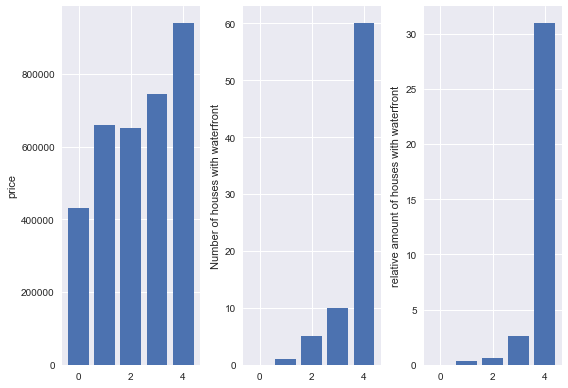

In [388]:
#plot 
fig, ax = plt.subplots(1,3)

ax[0].bar(x = views_df.index, height = views_df.median_price)
ax[0].set_ylabel('price')
ax[1].bar(x = views_df.index, height = views_df.waterfront_count)
ax[1].set_ylabel('Number of houses with waterfront')
ax[2].bar(x = views_df.index, height = views_df.percentage)
ax[2].set_ylabel('relative amount of houses with waterfront')
fig.tight_layout()


Houses with a better view score have a higher median price and also more houses in category 4 have access to water. However, there are so few houses with confirmed access to water (lots of missing values). That its predicitive power might be low.

## How does the number of floors affect housing prices?

In [558]:
#analyse using the mean and stdev 
floor = filtered_hp.groupby('floors')['price'].median()
floor_std = filtered_hp.groupby('floors')['price'].std()

fig = px.bar(x = floor.index, y = floor.values, #error_y = floor_std.values , 
             labels = {'y': 'price in USD', 'x':'number of floors'})
fig.update_traces(marker_color = 'white', marker_line_color = 'black', marker_line_width = 2)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig.update_layout(width = 600, height = 500,
                title_text = 'Median price dependening on the number of floors,
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.show()
fig.write_image('median_price_floors.png')

In [559]:
# analyse influence of floors on price using a boxplot
fig = px.box(filtered_hp, x = 'floors', y = 'price' , 
             labels = {'y': 'price in USD', 'x':'number of floors'})
fig.update_traces(marker_color = 'black', marker_line_color = 'black', marker_line_width = 2)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig.update_layout(width = 600, height = 500,
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.write_image('median_price_floors_box.png')

In [391]:
#get a look at the statistics
filtered_hp.groupby('floors')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
floors,,,,,,,,
1.0,10354.0,430541.235078,214797.784419,78000.0,275000.0,387500.0,525000.0,1640000.0
1.5,1838.0,541788.116431,251586.443058,92000.0,350500.0,520000.0,680750.0,1600000.0
2.0,7770.0,592878.328443,281837.801755,90000.0,374125.0,532750.0,749300.0,1640000.0
2.5,131.0,765911.183206,323516.761310,255000.0,528000.0,690000.0,931400.0,1600000.0
3.0,580.0,550270.624138,252089.980336,205000.0,383800.0,484475.0,619000.0,1630000.0
3.5,6.0,511916.666667,46972.775803,435000.0,490500.0,525000.0,539250.0,563500.0


In [392]:
# make correlation matrix
filtered_hp[['price', 'floors', 'sqft_living']].corr()

,price,floors,sqft_living
price,1.000000,0.277544,0.664765
floors,0.277544,1.000000,0.349747
sqft_living,0.664765,0.349747,1.000000


Only minor coorelation between house price and floor. As houses with 2.5 floors seem to be more expensive, a categorial value might be useful (yet it should be considered that only 118 observations have 2.5 floors). However, floors strongly correlates with sqft_living and might therfore be eliminated completly for linear regression.

## Does number of bedrooms correlate with housing price?

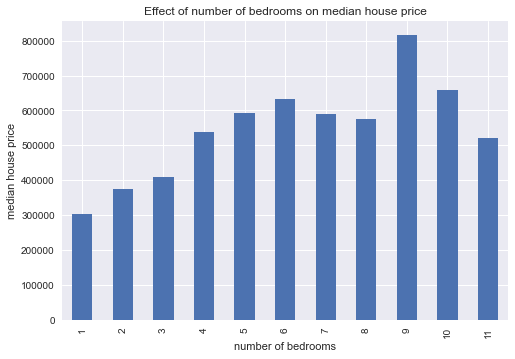

In [393]:
# analyse influence of bedrooms on house price
bedrooms = filtered_hp.groupby('bedrooms')['price'].median()
bedrooms.plot(kind = 'bar', title = 'Effect of number of bedrooms on median house price')
plt.ylabel('median house price')
plt.xlabel('number of bedrooms')
plt.show()

In [394]:
# make correlation matrix
filtered_hp[['price', 'bedrooms', 'sqft_living']].corr()

,price,bedrooms,sqft_living
price,1.000000,0.318794,0.664765
bedrooms,0.318794,1.000000,0.598442
sqft_living,0.664765,0.598442,1.000000


Up to 6 bedrooms, price rises with number of bedrooms but flattens with more bedrooms. We observe a moderate correlation bedween price and number of bedrooms but strong correlation of number of bedrooms and sqft_living.

#### Does the number of bedrooms per sqft_living correlate bether?

In [413]:
# calculate number of bedrooms per sqft living
filtered_hp['bedr_sqftliving'] = 100 * filtered_hp.bedrooms/filtered_hp.sqft_above

Text(0.5, 0, 'bedromms_per_sqft_living*100')

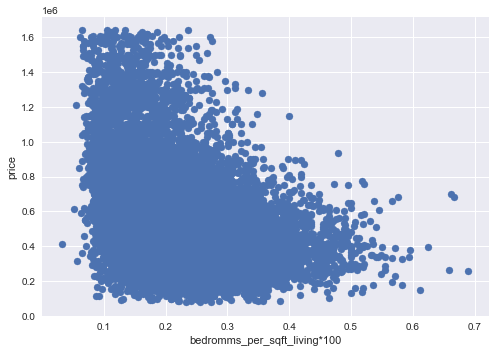

In [414]:
plt.scatter(x = filtered_hp.bedr_sqftliving, y = filtered_hp.price)
plt.ylabel('price')
plt.xlabel('bedromms_per_sqft_living*100')

In [415]:
# make correlation matrix
filtered_hp[['price', 'bedrooms', 'bedr_sqftliving', 'sqft_living']].corr()

,price,bedrooms,bedr_sqftliving,sqft_living
price,1.000000,0.318794,-0.341487,0.664765
bedrooms,0.318794,1.000000,0.201267,0.598442
bedr_sqftliving,-0.341487,0.201267,1.000000,-0.443936
sqft_living,0.664765,0.598442,-0.443936,1.000000


Bedrooms per living area seems to be a better predictor than number of bedrooms judged by pearson correlation coefficient analysis. As the correlation coefficient is negativ, many bedrooms in the house reduce the price. One could guess, that people want bigger rooms and are willing to pay more.

## How does number of bathrooms affect the housing price?

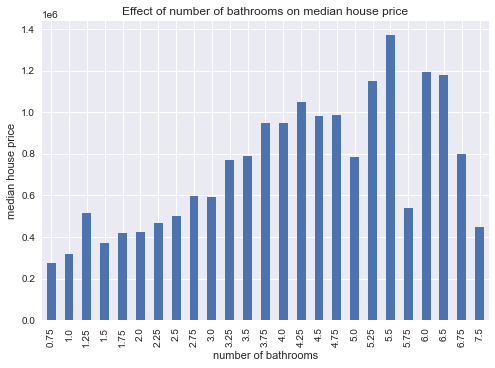

In [416]:
bathrooms = filtered_hp.groupby('bathrooms')['price'].median()
bathrooms.plot(kind = 'bar', title = 'Effect of number of bathrooms on median house price')
plt.ylabel('median house price')
plt.xlabel('number of bathrooms')
plt.show()

In [565]:
# get observations with 1.25 bathrooms
bath_hp = filtered_hp[filtered_hp['bathrooms'] == 1.25]
bath_hp.sort_values('price')

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,renovated,bins,yr_built_bins,bedr_sqftliving,bath_per_bed,bath_sqftliving,good_condition,date2,month
1612,2658000335,2014-10-27,275000.0,3,1.25,1230,4500,1.5,0.0,0.0,4,7,1230,0.0,1913,NaN,98118,47.5301,-122.271,1310,5000,102,0,0,1920,0.243902,0.416667,0.101626,1,2014/10,10
20164,1498301048,2014-05-08,321950.0,2,1.25,860,1277,2.0,0.0,0.0,3,7,860,0.0,2007,0.0,98144,47.5842,-122.314,1280,1265,8,0,1,2010,0.232558,0.625000,0.145349,1,2014/05,5
3593,793200100,2014-12-18,360000.0,3,1.25,2350,6200,1.0,0.0,0.0,4,7,1320,1030.0,1966,0.0,98007,47.5979,-122.135,2140,9543,49,0,1,1970,0.227273,0.416667,0.094697,1,2014/12,12
933,1455100116,2015-02-02,397500.0,3,1.25,1510,13737,1.0,0.0,3.0,4,6,810,700.0,1961,0.0,98125,47.7289,-122.283,2560,10202,54,0,1,1970,0.370370,0.416667,0.154321,1,2015/02,2
20622,688000017,2014-06-27,516500.0,1,1.25,1100,638,3.0,NaN,0.0,3,9,1100,0.0,2014,0.0,98112,47.6228,-122.307,1110,1933,1,0,3,2020,0.090909,1.250000,0.113636,1,2014/06,6
16121,955000430,2014-09-03,540000.0,2,1.25,1230,1569,2.0,0.0,0.0,3,9,1050,180.0,2009,0.0,98112,47.6193,-122.304,1100,1230,6,0,3,2010,0.190476,0.625000,0.119048,1,2014/09,9
19817,7589700055,2014-06-11,545000.0,2,1.25,1240,2150,2.0,0.0,0.0,3,8,1240,0.0,2014,0.0,98117,47.6884,-122.374,1340,5289,1,0,1,2020,0.161290,0.625000,0.100806,1,2014/06,6
8101,724069023,2015-04-14,1250000.0,1,1.25,1810,5070,1.5,1.0,4.0,4,8,1230,580.0,1967,0.0,98075,47.5814,-122.081,2280,5070,48,0,3,1970,0.081301,1.250000,0.101626,1,2015/04,4
17864,9829201020,2014-11-18,1390000.0,3,1.25,2400,6653,3.0,0.0,2.0,3,11,2400,0.0,1992,NaN,98122,47.6019,-122.290,1910,6653,23,0,1,2000,0.125000,0.416667,0.052083,1,2014/11,11


Eventhough there are only 9 observations in the dataset, I assume that these properties are a bit more expensive than aprtments with one or 2 full bathrooms as they are popular with families (2 bathrooms with a toilet, one of them with a shower (0.75, 0.5).

In [417]:
# Calculate the number of bathrooms per bedrooms
filtered_hp['bath_per_bed'] = filtered_hp['bathrooms']/filtered_hp['bedrooms']

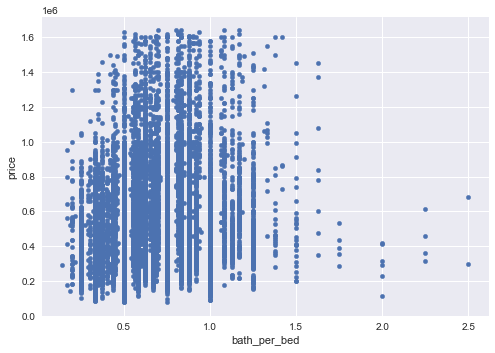

In [418]:
filtered_hp.plot.scatter(x = 'bath_per_bed', y = 'price');

In [419]:
filtered_hp['bath_sqftliving'] = 100*filtered_hp.bathrooms/filtered_hp.sqft_above

Text(0.5, 0, 'bathrooms_per_sqft_living*100')

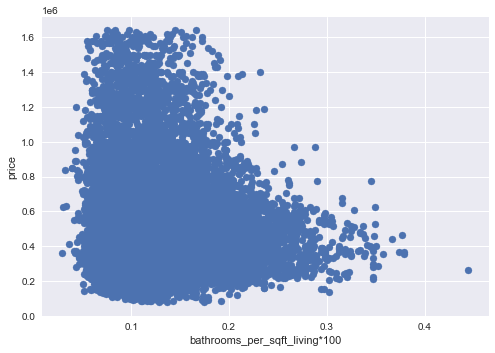

In [420]:
plt.scatter(x = filtered_hp.bath_sqftliving, y = filtered_hp.price)
plt.ylabel('price')
plt.xlabel('bathrooms_per_sqft_living*100')

In [421]:
# make correlation matrix
filtered_hp[['price', 'bedrooms', 'bathrooms', 'bath_per_bed', 'bath_sqftliving', 'sqft_living']].corr()

,price,bedrooms,bathrooms,bath_per_bed,bath_sqftliving,sqft_living
price,1.000000,0.318794,0.495330,0.256871,-0.133055,0.664765
bedrooms,0.318794,1.000000,0.516697,-0.260124,-0.050177,0.598442
bathrooms,0.495330,0.516697,1.000000,0.645490,0.285985,0.734861
bath_per_bed,0.256871,-0.260124,0.645490,1.000000,0.402521,0.277671
bath_sqftliving,-0.133055,-0.050177,0.285985,0.402521,1.000000,-0.224036
sqft_living,0.664765,0.598442,0.734861,0.277671,-0.224036,1.000000


## How does the condition score affect the price?

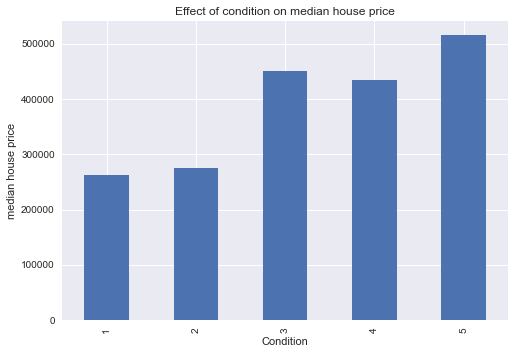

In [422]:
condition = filtered_hp.groupby('condition')['price'].median()
condition.plot(kind = 'bar', title = 'Effect of condition on median house price')
plt.ylabel('median house price')
plt.xlabel('Condition')
plt.show()

Condition 3,4,5 have a higher median price than houses with a condition score of 1 or 2. 

In [423]:
# Make a good condition score if condition >2 
filtered_hp['good_condition'] = (filtered_hp.condition >2)*1

In [424]:
#median prices per condition and grade
pd.pivot_table(filtered_hp,index = 'condition', columns = 'grade', values = 'price', aggfunc = 'median')

grade,3,4,5,6,7,8,9,10,11,12
condition,,,,,,,,,,
1,NaN,150000.0,190000.0,255000.0,380000.0,932500.0,NaN,NaN,NaN,NaN
2,NaN,132500.0,180000.0,235000.0,305000.0,427000.0,715000.0,950000.0,NaN,NaN
3,NaN,196500.0,244950.0,265000.0,358000.0,485000.0,684000.0,860000.0,1120000.0,1470000.0
4,NaN,238525.0,228700.0,299000.0,389000.0,571750.0,815000.0,925000.0,1250000.0,1430000.0
5,262000.0,NaN,227450.0,285000.0,455000.0,695000.0,995000.0,1315000.0,1520000.0,1580000.0


In [425]:
# make correlation matrix
filtered_hp[['price','condition', 'good_condition']].corr()

,price,condition,good_condition
price,1.000000,0.034633,0.071863
condition,0.034633,1.000000,0.232343
good_condition,0.071863,0.232343,1.000000


## How does the grade affect the house price

In [426]:
#group data by grade and calculate median of house prices
grade = filtered_hp.groupby('grade')['price'].median()

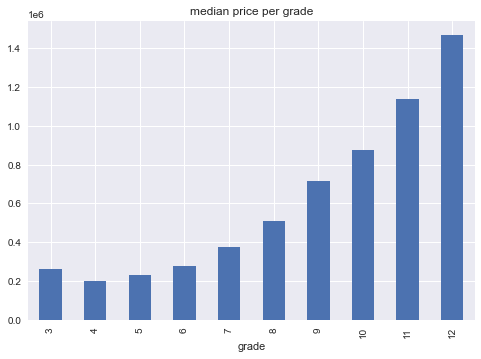

In [427]:
# plot median prices against grade score
grade.plot(kind = 'bar', title = 'median price per grade');

They grade seems to strongly affect the house price. However, the correlation is not linear and grade should be converted to categorial/dummy variables.

## Does the date of sellings play a role?

In [428]:
# Remove the day from the data and put it in a new colum called 'date2'
filtered_hp['date'] = pd.to_datetime(filtered_hp.date)
filtered_hp['date2'] = pd.to_datetime(filtered_hp['date'], format = '%Y-%m-%d').dt.strftime('%Y/%m')

In [429]:
filtered_hp[['date', 'date2']].head(5)

,date,date2
0,2014-10-13,2014/10
1,2014-12-09,2014/12
2,2015-02-25,2015/02
3,2014-12-09,2014/12
4,2015-02-18,2015/02


In [660]:
a = filtered_hp.groupby('month')['price'].median()

fig = px.line(data_frame= a , x= a.index, y=a.values , title = 'median price development over the year',
       labels = {'y':'price in USD'})
fig.update_traces(line=dict(color = 'black', width = 2))
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig.update_layout(width = 700, height = 600, plot_bgcolor='rgba(0,0,0,0)')
fig.show()
fig.write_image('property_price_selling_time.png')

In [431]:
# make a colum that contains the month the property was sold
filtered_hp['month'] = pd.to_datetime(filtered_hp['date'], format = '%Y-%m-%d').dt.strftime('%m')

In [432]:
filtered_hp[['date', 'date2', 'month']].head(10)

,date,date2,month
0,2014-10-13,2014/10,10
1,2014-12-09,2014/12,12
2,2015-02-25,2015/02,02
3,2014-12-09,2014/12,12
4,2015-02-18,2015/02,02
5,2014-05-12,2014/05,05
6,2015-04-15,2015/04,04
7,2015-03-12,2015/03,03
8,2015-04-03,2015/04,04
9,2014-05-27,2014/05,05


In [433]:
fig = px.box(data_frame= filtered_hp , x= 'month', y='price', title = 'price per month',
       labels = { 'price':'price in USD'})
fig.update_traces(marker_color = 'black', marker_line_color = 'black', marker_line_width = 2)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig.update_layout(width = 600, height = 500,
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')
fig.show()

In [434]:
# convert month to numeric value
filtered_hp.month = pd.to_numeric(filtered_hp.month);
filtered_hp.month.dtype

dtype('int64')

In [435]:
# make correlation matrix
filtered_hp[['price', 'month']].corr()

,price,month
price,1.000000,-0.010927
month,-0.010927,1.000000


In [436]:
filtered_hp.groupby('month')['price'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
month,,,,,,,,
1,922.0,485946.78,256177.20,99000.0,301267.25,432250.0,607250.00,1630000.0
2,1195.0,481429.46,251208.35,89950.0,305000.00,424950.0,594350.00,1630000.0
3,1791.0,508869.83,263786.87,81000.0,315250.50,447500.0,639950.00,1600000.0
4,2139.0,532727.01,266423.50,84000.0,336850.00,472000.0,652550.00,1640000.0
5,2312.0,510484.72,258039.78,78000.0,326075.00,455000.0,625000.00,1620000.0
6,2084.0,523250.71,262811.79,92000.0,330000.00,460000.0,654237.50,1640000.0
7,2122.0,513697.42,261883.57,86500.0,320000.00,456150.0,640000.00,1640000.0
8,1858.0,501629.08,252752.52,107000.0,320000.00,435500.0,625000.00,1620000.0
9,1692.0,498434.02,244330.52,85000.0,323875.00,445000.0,615000.00,1600000.0


Eventhough the effect is small properties are solt for higher prices in spring, espacially in April, and lowest prices are paid in winter.

# Model prediction-Simple linear regression

In [437]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error as mape
from sklearn.metrics import r2_score

In [438]:
test_df.head(2)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,renovated,bins
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,60,0,0
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,64,1,1


In [441]:
# drop observations with missing information on 'waterfront' as sklearn does not accept NaN
test_df = filtered_hp.dropna(subset = ['waterfront'], axis = 0)

In [572]:
df_x = test_df[['month', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15',
               'bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 'condition', 'grade', 'renovated', 'good_condition',
              'bins', 'month', 'yr_built', 'zipcode', 'lat', 'long', 'waterfront']]

In [573]:
df_y = pd.DataFrame(test_df.price)

In [574]:
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y, test_size = 0.25, random_state = 1234)

In [656]:
reg = LinearRegression()

In [576]:
# function to calculate and print MAPE and R2
def calc_mape(factor, test, predict):
    my_mape = np.mean(np.abs(test-predict)/y_test)*100
    #print(type(my_mape))
    print(f'The MAPE for {factor:15}=  {my_mape.values.round(2)}.')
    print(f'The R^2 for {factor:15}= {format(r2_score(test, predict), "5.2e")}.')
    


In [449]:
# calculate MAPE for all variables assuming linearity, no dummies, excluding waterfront, 
cols = ['month', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15','bedrooms',
        'bathrooms', 'floors','view', 'condition', 'grade', 'renovated', 'good_condition','bins', 'month', 'renovated',
        'zipcode', 'waterfront']

for col in x_train[cols]:
    x_train2 = pd.DataFrame(x_train[col])
    x_test2 = pd.DataFrame(x_test[col])
    reg.fit(x_train2, y_train)
    y_predict = reg.predict(x_test2)
    calc_mape(col, y_test, y_predict)

The MAPE for month          =  [47.51].
The R^2 for month          = -1.68e-03.
The MAPE for month          =  [47.51].
The R^2 for month          = -1.68e-03.
The MAPE for sqft_living    =  [33.16].
The R^2 for sqft_living    = 4.51e-01.
The MAPE for sqft_lot       =  [47.14].
The R^2 for sqft_lot       = 6.05e-03.
The MAPE for sqft_above     =  [37.23].
The R^2 for sqft_above     = 3.18e-01.
The MAPE for sqft_basement  =  [44.89].
The R^2 for sqft_basement  = 9.48e-02.
The MAPE for sqft_living15  =  [35.66].
The R^2 for sqft_living15  = 3.57e-01.
The MAPE for sqft_lot15     =  [47.21].
The R^2 for sqft_lot15     = 4.80e-03.
The MAPE for bedrooms       =  [44.46].
The R^2 for bedrooms       = 9.63e-02.
The MAPE for bathrooms      =  [39.05].
The R^2 for bathrooms      = 2.53e-01.
The MAPE for floors         =  [44.72].
The R^2 for floors         = 7.57e-02.
The MAPE for view           =  [45.09].
The R^2 for view           = 1.04e-01.
The MAPE for condition      =  [47.45].
The R^2 fo

## Sequentially add variables - Multiple linear Regression

In [577]:
# function for quick regression analysis and printing of some metrics
def reg_calculator(variables):
    x_train2 = pd.DataFrame(x_train[variables])
    x_test2 = pd.DataFrame(x_test[variables])
    reg.fit(x_train2, y_train)
    y_predict = reg.predict(x_test2)
    my_mape = np.mean(np.abs(y_test-y_predict)/y_test)*100
    r2 = r2_score(y_test, y_predict)
    #r2_adjusted = 1-(1-r2) * ((len(y_predict)-1)/(len(y_predict) - len(variables)-1))
    r2_adjusted = r2 -((len(variables)-1)/(len(y_predict)-len(variables)))*(1-r2)
    print(f'Mape         = {my_mape.values.round(2)}')
    print(f'R^2          = {round(r2,10)}')
    print(f'R^2_adjusted = {round(r2_adjusted,10)}')
    


In [578]:
var = ['sqft_living']
reg_calculator(var)

Mape         = [33.16]
R^2          = 0.4506352463
R^2_adjusted = 0.4506352463


In [579]:
var = ['sqft_living', 'bins']
reg_calculator(var)

Mape         = [22.48]
R^2          = 0.6806892575
R^2_adjusted = 0.6806197666


In [580]:
var = ['sqft_living', 'lat']
reg_calculator(var)

Mape         = [25.26]
R^2          = 0.5746513144
R^2_adjusted = 0.5745587467


In [581]:
var = ['sqft_living', 'bins', 'lat']
reg_calculator(var)

Mape         = [20.51]
R^2          = 0.7030228721
R^2_adjusted = 0.702893583


In [582]:
var = ['sqft_living', 'bins', 'lat', 'sqft_lot']
reg_calculator(var)

Mape         = [20.44]
R^2          = 0.7033187377
R^2_adjusted = 0.7031249551


In [583]:
var = ['sqft_living', 'bins', 'lat', 'grade']
reg_calculator(var)

Mape         = [20.24]
R^2          = 0.7214800398
R^2_adjusted = 0.7212981195


In [584]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view']
reg_calculator(var)

Mape         = [19.42]
R^2          = 0.7493653257
R^2_adjusted = 0.7491470028


In [585]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view', 'condition']
reg_calculator(var)

Mape         = [19.08]
R^2          = 0.7574889638
R^2_adjusted = 0.7572248481


In [586]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view', 'condition', 'bedrooms']
reg_calculator(var)

Mape         = [18.94]
R^2          = 0.7586778966
R^2_adjusted = 0.7583624429


In [587]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view', 'condition', 'bedrooms', 'bathrooms']
reg_calculator(var)

Mape         = [18.94]
R^2          = 0.7586125291
R^2_adjusted = 0.7582443199


In [588]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view', 'condition', 'bedrooms', 'renovated']
reg_calculator(var)

Mape         = [18.94]
R^2          = 0.7635073829
R^2_adjusted = 0.7631466402


In [589]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view', 'condition', 'bedrooms', 'month']
reg_calculator(var)

Mape         = [18.93]
R^2          = 0.7595112792
R^2_adjusted = 0.7591444409


In [590]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view', 'condition', 'bedrooms', 'renovated', 'sqft_lot']
reg_calculator(var)

Mape         = [18.9]
R^2          = 0.7636723856
R^2_adjusted = 0.7632603061


In [591]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view', 'condition', 'bedrooms', 'renovated', 'sqft_lot', 'long']
reg_calculator(var)

Mape         = [19.06]
R^2          = 0.7766113043
R^2_adjusted = 0.7761730008


In [592]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view', 'condition', 'bedrooms', 'renovated', 'sqft_lot', 'sqft_living15']
reg_calculator(var)

Mape         = [18.9]
R^2          = 0.7638608797
R^2_adjusted = 0.7633975589


In [593]:
var = ['sqft_living', 'bins', 'lat', 'grade', 'view', 'condition', 'bedrooms', 'renovated', 'sqft_lot', 'long','zipcode']
reg_calculator(var)

Mape         = [18.99]
R^2          = 0.7774343942
R^2_adjusted = 0.7769490789


In [594]:
var = ['sqft_living', 'lat', 'grade', 'view', 'condition', 'bedrooms', 'renovated', 'sqft_lot', 'bins']
reg_calculator(var)

Mape         = [18.9]
R^2          = 0.7636723856
R^2_adjusted = 0.7632603061


In [595]:
# using all variables
var = list(df_x.columns)
reg_calculator(df_x.columns)


Mape         = [18.48]
R^2          = 0.7925252867
R^2_adjusted = 0.7915273759


### Get dummy values for ordinal values

In [596]:
# create dummies
df_dummies = pd.get_dummies(test_df, drop_first = True,
                            columns = ['month', 'grade', 'condition', 'zipcode', 'view', 'floors', 'bathrooms', 'bedrooms', 'yr_built'] )

In [597]:
# remove date and id column, yr_renovated
df_dummies = df_dummies.drop('id', axis = 1)
df_dummies = df_dummies.drop('date', axis = 1)
df_dummies = df_dummies.drop('yr_renovated', axis = 1)

In [598]:
df_dummies = df_dummies.dropna(subset = ['waterfront'], axis = 0)

In [599]:
df_dummies.shape

(18386, 269)

In [600]:
df_dummies.head(5)

,price,sqft_living,sqft_lot,waterfront,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,age,renovated,bins,yr_built_bins,bedr_sqftliving,bath_per_bed,bath_sqftliving,good_condition,date2,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,grade_4,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,grade_11,grade_12,condition_2,condition_3,condition_4,condition_5,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,view_1.0,view_2.0,view_3.0,view_4.0,floors_1.5,floors_2.0,floors_2.5,floors_3.0,floors_3.5,bathrooms_1.0,bathrooms_1.25,bathrooms_1.5,bathrooms_1.75,bathrooms_2.0,bathrooms_2.25,bathrooms_2.5,bathrooms_2.75,bathrooms_3.0,bathrooms_3.25,bathrooms_3.5,bathrooms_3.75,bathrooms_4.0,bathrooms_4.25,bathrooms_4.5,bathrooms_4.75,bathrooms_5.0,bathrooms_5.25,bathrooms_5.5,bathrooms_5.75,bathrooms_6.0,bathrooms_6.75,bathrooms_7.5,bedrooms_2,bedrooms_3,bedrooms_4,bedrooms_5,bedrooms_6,bedrooms_7,bedrooms_8,bedrooms_9,bedrooms_10,bedrooms_11,yr_built_1901,yr_built_1902,yr_built_1903,yr_built_1904,yr_built_1905,yr_built_1906,yr_built_1907,yr_built_1908,yr_built_1909,yr_built_1910,yr_built_1911,yr_built_1912,yr_built_1913,yr_built_1914,yr_built_1915,yr_built_1916,yr_built_1917,yr_built_1918,yr_built_1919,yr_built_1920,yr_built_1921,yr_built_1922,yr_built_1923,yr_built_1924,yr_built_1925,yr_built_1926,yr_built_1927,yr_built_1928,yr_built_1929,yr_built_1930,yr_built_1931,yr_built_1932,yr_built_1933,yr_built_1934,yr_built_1935,yr_built_1936,yr_built_1937,yr_built_1938,yr_built_1939,yr_built_1940,yr_built_1941,yr_built_1942,yr_built_1943,yr_built_1944,yr_built_1945,yr_built_1946,yr_built_1947,yr_built_1948,yr_built_1949,yr_built_1950,yr_built_1951,yr_built_1952,yr_built_1953,yr_built_1954,yr_built_1955,yr_built_1956,yr_built_1957,yr_built_1958,yr_built_1959,yr_built_1960,yr_built_1961,yr_built_1962,yr_built_1963,yr_built_1964,yr_built_1965,yr_built_1966,yr_built_1967,yr_built_1968,yr_built_1969,yr_built_1970,yr_built_1971,yr_built_1972,yr_built_1973,yr_built_1974,yr_built_1975,yr_built_1976,yr_built_1977,yr_built_1978,yr_built_1979,yr_built_1980,yr_built_1981,yr_built_1982,yr_built_1983,yr_built_1984,yr_built_1985,yr_built_1986,yr_built_1987,yr_built_1988,yr_built_1989,yr_built_1990,yr_built_1991,yr_built_1992,yr_built_1993,yr_built_1994,yr_built_1995,yr_built_1996,yr_built_1997,yr_built_1998,yr_built_1999,yr_built_2000,yr_built_2001,yr_built_2002,yr_built_2003,yr_built_2004,yr_built_2005,yr_built_2006,yr_built_2007,yr_built_2008,yr_built_2009,yr_built_2010,yr_built_2011,yr_built_2012,yr_built_2013,yr_built_2014,yr_built_2015
1,538000.0,2570,7242,0.0,2170,400.0,47.7210,-122.319,1690,7639,64,1,1,1960,0.138249,0.750000,0.103687,1,2014/12,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [601]:
#drop sqft_above and sqft_basement as they are highly co-correlated with sqft_living
df_dummies = df_dummies.drop('sqft_above', axis = 1)
df_dummies = df_dummies.drop('sqft_basement', axis = 1)

In [602]:
## split into y and x values
df_dummies_y = pd.DataFrame(df_dummies.price)
df_dummies_x = df_dummies.iloc[::, 1:]

In [603]:
df_dummies_x.head(2)

,sqft_living,sqft_lot,waterfront,lat,long,sqft_living15,sqft_lot15,age,renovated,bins,yr_built_bins,bedr_sqftliving,bath_per_bed,bath_sqftliving,good_condition,date2,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,grade_4,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,grade_11,grade_12,condition_2,condition_3,condition_4,condition_5,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,view_1.0,view_2.0,view_3.0,view_4.0,floors_1.5,floors_2.0,floors_2.5,floors_3.0,floors_3.5,bathrooms_1.0,bathrooms_1.25,bathrooms_1.5,bathrooms_1.75,bathrooms_2.0,bathrooms_2.25,bathrooms_2.5,bathrooms_2.75,bathrooms_3.0,bathrooms_3.25,bathrooms_3.5,bathrooms_3.75,bathrooms_4.0,bathrooms_4.25,bathrooms_4.5,bathrooms_4.75,bathrooms_5.0,bathrooms_5.25,bathrooms_5.5,bathrooms_5.75,bathrooms_6.0,bathrooms_6.75,bathrooms_7.5,bedrooms_2,bedrooms_3,bedrooms_4,bedrooms_5,bedrooms_6,bedrooms_7,bedrooms_8,bedrooms_9,bedrooms_10,bedrooms_11,yr_built_1901,yr_built_1902,yr_built_1903,yr_built_1904,yr_built_1905,yr_built_1906,yr_built_1907,yr_built_1908,yr_built_1909,yr_built_1910,yr_built_1911,yr_built_1912,yr_built_1913,yr_built_1914,yr_built_1915,yr_built_1916,yr_built_1917,yr_built_1918,yr_built_1919,yr_built_1920,yr_built_1921,yr_built_1922,yr_built_1923,yr_built_1924,yr_built_1925,yr_built_1926,yr_built_1927,yr_built_1928,yr_built_1929,yr_built_1930,yr_built_1931,yr_built_1932,yr_built_1933,yr_built_1934,yr_built_1935,yr_built_1936,yr_built_1937,yr_built_1938,yr_built_1939,yr_built_1940,yr_built_1941,yr_built_1942,yr_built_1943,yr_built_1944,yr_built_1945,yr_built_1946,yr_built_1947,yr_built_1948,yr_built_1949,yr_built_1950,yr_built_1951,yr_built_1952,yr_built_1953,yr_built_1954,yr_built_1955,yr_built_1956,yr_built_1957,yr_built_1958,yr_built_1959,yr_built_1960,yr_built_1961,yr_built_1962,yr_built_1963,yr_built_1964,yr_built_1965,yr_built_1966,yr_built_1967,yr_built_1968,yr_built_1969,yr_built_1970,yr_built_1971,yr_built_1972,yr_built_1973,yr_built_1974,yr_built_1975,yr_built_1976,yr_built_1977,yr_built_1978,yr_built_1979,yr_built_1980,yr_built_1981,yr_built_1982,yr_built_1983,yr_built_1984,yr_built_1985,yr_built_1986,yr_built_1987,yr_built_1988,yr_built_1989,yr_built_1990,yr_built_1991,yr_built_1992,yr_built_1993,yr_built_1994,yr_built_1995,yr_built_1996,yr_built_1997,yr_built_1998,yr_built_1999,yr_built_2000,yr_built_2001,yr_built_2002,yr_built_2003,yr_built_2004,yr_built_2005,yr_built_2006,yr_built_2007,yr_built_2008,yr_built_2009,yr_built_2010,yr_built_2011,yr_built_2012,yr_built_2013,yr_built_2014,yr_built_2015
1,2570,7242,0.0,47.7210,-122.319,1690,7639,64,1,1,1960,0.138249,0.75,0.103687,1,2014/12,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [604]:
# split into train and test set
x_train_d, x_test_d, y_train_d, y_test_d = train_test_split(
    df_dummies_x, df_dummies_y, test_size = 0.25, random_state = 1234)

In [638]:
# function for multiple linear regression and printing MAPE, R2 and R2_adjusted
def reg_calculator_d(variables):
    x_train2 = x_train_d[variables]
    x_test2 = x_test_d[variables]
    reg.fit(x_train2, y_train_d)
    y_predict = reg.predict(x_test2)
    my_mape = np.mean(np.abs(y_test_d-y_predict)/y_test_d)*100
    r2 = r2_score(y_test, y_predict)
    #r2_adjusted = 1-(1-r2) * ((len(y_predict)-1)/(len(y_predict) - len(variables)-1))
    r2_adjusted = r2 -((len(variables)-1)/(len(y_predict)-len(variables)))*(1-r2)
    print(f'Mape         = {my_mape.values.round(2)}')
    print(f'R^2          = {round(r2,10)}')
    print(f'R^2_adjusted = {round(r2_adjusted,10)}')

In [639]:
variables = ['sqft_living']
reg_calculator_d(variables)

Mape         = [33.16]
R^2          = 0.4506352463
R^2_adjusted = 0.4506352463


In [640]:
variables = ['sqft_living', 'waterfront']
reg_calculator_d(variables)

Mape         = [33.01]
R^2          = 0.4585676174
R^2_adjusted = 0.4584497866


In [641]:
variables = ['sqft_living', 'waterfront', 'lat']
reg_calculator_d(variables)

Mape         = [25.06]
R^2          = 0.584930995
R^2_adjusted = 0.5847502945


In [642]:
variables = ['sqft_living', 'waterfront', 'lat', 'renovated']
reg_calculator_d(variables)

Mape         = [24.95]
R^2          = 0.5910208358
R^2_adjusted = 0.5907537037


In [643]:
variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'good_condition']
reg_calculator_d(variables)

Mape         = [24.89]
R^2          = 0.5913268064
R^2_adjusted = 0.5909708193


In [644]:
variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'good_condition', 'bins']
reg_calculator_d(variables)

Mape         = [20.25]
R^2          = 0.7171936486
R^2_adjusted = 0.7168856478


In [645]:
variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'good_condition', 'bins', 'bath_per_bed']
reg_calculator_d(variables)

Mape         = [20.2]
R^2          = 0.7192915224
R^2_adjusted = 0.7189245832


In [646]:
views = [col for col in x_train_d.columns if 'view' in col]

variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'good_condition', 'bins', 'bath_per_bed'] + views

reg_calculator_d(variables)

Mape         = [19.5]
R^2          = 0.740828393
R^2_adjusted = 0.7402632565


In [647]:
variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'good_condition', 'bins', 'bath_per_bed']
views = [col for col in x_train_d.columns if 'view' in col]
condition = [col for col in x_train_d.columns if 'condition' in col]

variables = variables + views + condition

reg_calculator_d(variables)

Mape         = [19.3]
R^2          = 0.7461990109
R^2_adjusted = 0.7453679664


In [648]:
variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'good_condition', 'bins', 'bath_per_bed']
views = [col for col in x_train_d.columns if 'view' in col]
condition = [col for col in x_train_d.columns if 'condition' in col]
grade = [col for col in x_train_d.columns if 'grade' in col]

variables = variables + views + condition + grade

reg_calculator_d(variables)

Mape         = [18.32]
R^2          = 0.7718654199
R^2_adjusted = 0.770667863


In [649]:
variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'good_condition', 'bins', 'bath_per_bed']
views = [col for col in x_train_d.columns if 'view' in col]
condition = [col for col in x_train_d.columns if 'condition' in col]
grade = [col for col in x_train_d.columns if 'grade' in col]
month = [col for col in x_train_d.columns if 'month_' in col]

variables = variables + views + condition + grade + month

reg_calculator_d(variables)

Mape         = [18.27]
R^2          = 0.773219125
R^2_adjusted = 0.7714788639


In [650]:
# [#'month', #'grade', #'condition', #'zipcode', #'view', 'floors', 'bathrooms', 'bedrooms', 'yr_built'] )
variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'good_condition', 'bath_per_bed']
views = [col for col in x_train_d.columns if 'view' in col]
condition = [col for col in x_train_d.columns if 'condition' in col]
grade = [col for col in x_train_d.columns if 'grade' in col]
month = [col for col in x_train_d.columns if 'month_' in col]
zipcode = [col for col in x_train_d.columns if 'zipcode_' in col]

variables = variables + views + condition + grade + month + zipcode

reg_calculator_d(variables)

Mape         = [15.63]
R^2          = 0.840125353
R^2_adjusted = 0.8364602987


In [651]:
# [#'month', #'grade', #'condition', #'zipcode', #'view', #'floors', 'bathrooms', 'bedrooms', 'yr_built'] )
variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'good_condition', 'bath_per_bed']
views = [col for col in x_train_d.columns if 'view' in col]
condition = [col for col in x_train_d.columns if 'condition' in col]
grade = [col for col in x_train_d.columns if 'grade' in col]
month = [col for col in x_train_d.columns if 'month_' in col]
zipcode = [col for col in x_train_d.columns if 'zipcode_' in col]
floors = [col for col in x_train_d.columns if 'floor' in col]

variables = variables + views + condition + grade + month + zipcode

reg_calculator_d(variables)

Mape         = [15.63]
R^2          = 0.840125353
R^2_adjusted = 0.8364602987


In [652]:
# [#'month', #'grade', #'condition', #'zipcode', #'view', #'floors', 'bathrooms', 'bedrooms', 'yr_built'] )
variables = ['sqft_living', 'waterfront', 'lat', 'renovated', 'bath_per_bed']
views = [col for col in x_train_d.columns if 'view' in col]
condition = [col for col in x_train_d.columns if 'condition' in col]
grade = [col for col in x_train_d.columns if 'grade' in col]
month = [col for col in x_train_d.columns if 'month_' in col]
zipcode = [col for col in x_train_d.columns if 'zipcode_' in col]
floors = [col for col in x_train_d.columns if 'floor' in col]
yr_built = [col for col in x_train_d.columns if 'yr_built_' in col]

variables = variables + views + condition + grade + month + zipcode + yr_built

reg_calculator_d(variables)

Mape         = [15.69]
R^2          = 0.8423806432
R^2_adjusted = 0.8345320777


In [653]:
variables = ['sqft_living'] + grade + zipcode 
reg_calculator_d(variables)

Mape         = [16.7]
R^2          = 0.8114532368
R^2_adjusted = 0.8081981134


When only using 'sqft_living', grade score (as dummy variables) and 'zipcodes' (as dummy variables), the model is close to a model using almost all variables/predictors.

Not done yet: Residuals plot